In [ ]:
import networkx as nx 
import matplotlib.pyplot as plt
import operator
G = nx.DiGraph()

In [ ]:
import csv
from tqdm import tqdm

with open('airdata1.csv', 'r') as f:
    data = csv.reader(f)
    headers = next(data)
    for row in tqdm(data):
        G.add_node(row[0])
        G.add_node(row[1])
        if G.has_edge(row[0], row[1]):
            G[row[0]][row[1]]['weight'] += 1
        else:
            G.add_edge(row[0], row[1], weight = 1)

67663it [00:00, 213730.77it/s]


In [ ]:
G.remove_node('\\N')
G_nodes = G.number_of_nodes()
G_edges = G.number_of_edges()
print("Nodes = ", G_nodes, " Edges = ",G_edges)

Nodes =  3333  Edges =  37274


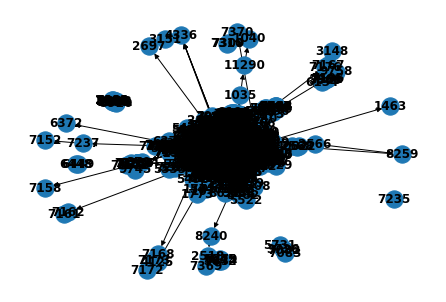

In [ ]:
nx.draw(G, with_labels=True, font_weight='bold')

In [ ]:
with open('airdata.csv','r') as csv_file:
    lines = csv_file.readlines()

lines = lines[1:]
city = []
city_no=dict()

for line in lines:
    data = line.split(',')
    temp = list(((data[2])[1:-1],(data[1][1:-1])))
    city.append(data[2][1:-1])
    city_no[data[0]]=temp
print(city)
print(city_no)


['Goroka', 'Madang', 'Mount Hagen', 'Nadzab', 'Port Moresby', 'Wewak', 'Narssarssuaq', 'Godthaab', 'Sondrestrom', 'Thule', 'Akureyri', 'Egilsstadir', 'Hofn', 'Husavik', 'Isafjordur', 'Keflavik', 'Patreksfjordur', 'Reykjavik', 'Siglufjordur', 'Vestmannaeyjar', 'Sault Sainte Marie', 'Winnipeg', 'Halifax', 'St. Anthony', 'Tofino', 'Pelly Bay', 'Baie Comeau', 'Bagotville', 'Baker Lake', 'Campbell River', 'Brandon', 'Cambridge Bay', 'Nanaimo', 'Castlegar', 'Chatham', 'Charlo', 'Coppermine', 'Coronation', 'Chilliwack', 'Clyde River', 'Coral Harbour', 'Dawson', 'Burwash', 'Princeton', 'Deer Lake', 'Dease Lake', 'Dauphin', 'Dawson Creek', 'Edmonton', 'Eskimo Point', 'Estevan', 'Edson', 'Eureka', 'Inuvik', 'Iqaluit', 'Fredericton', 'Forestville', 'Flin Flon', 'Fort Resolution', 'Fort Simpson', 'Kingston', 'La Grande Riviere', 'Gaspe', 'Geraldton', 'Iles De La Madeleine', 'Hudson Bay', 'Dryden', 'Holman Island', 'Gjoa Haven', 'Hamilton', 'Montreal', 'Hay River', 'Halifax', 'Atikokan', 'Pond Inle

#shortest path

Enter the Source City : paris
Enter the destination City :philadelphia
 path -  1
Paris Airport - Charles de Gaulle International Airport to 
Philadelphia Airport - Philadelphia International Airport

 path -  2
Paris Airport - Paris-Orly Airport to 
Athens Airport - Eleftherios Venizelos International Airport to 
Philadelphia Airport - Philadelphia International Airport



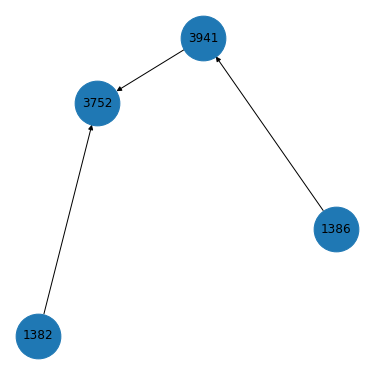

In [ ]:
source = input('Enter the Source City : ')
destination = input('Enter the destination City :')
source_List = []
destination_List = []

for line in lines:
  data = line.split(",")
  if(source.lower() == (data[2][1:-1]).lower()):
    source_List.append(data[0])
  elif(destination.lower() == (data[2][1:-1]).lower()):
    destination_List.append(data[0])
possible_path = []
nodes = list(G.nodes)
for i in source_List:
  if(i in nodes):
    for j in destination_List:
      if(j in nodes):
        path = nx.shortest_path(G,i,j,method='dijkstra')
        possible_path.append(path)
cnt =1 
for i in possible_path:
  print(" path - ",cnt)
  for j in i:
    if(j != i[len(i)-1]):
      re = city_no[j][0]
      re += " Airport - "
      re += city_no[j][1]
      re += " to "
      print(re)
    else:
      re = city_no[j][0]
      re += " Airport - "
      re += city_no[j][1]
      print(re)
  print()
  cnt +=1

new_g_1 = nx.DiGraph()

for i in possible_path:
  for j in i:
    new_g_1.add_node(j)
for i in possible_path:
  for j in range(len(i)-1):
    new_g_1.add_edge(i[j],i[j+1])


plt.figure(figsize=(5,5))
nx.draw(new_g_1,with_labels=True, node_size=2000)

#possible shortest path from source to destination

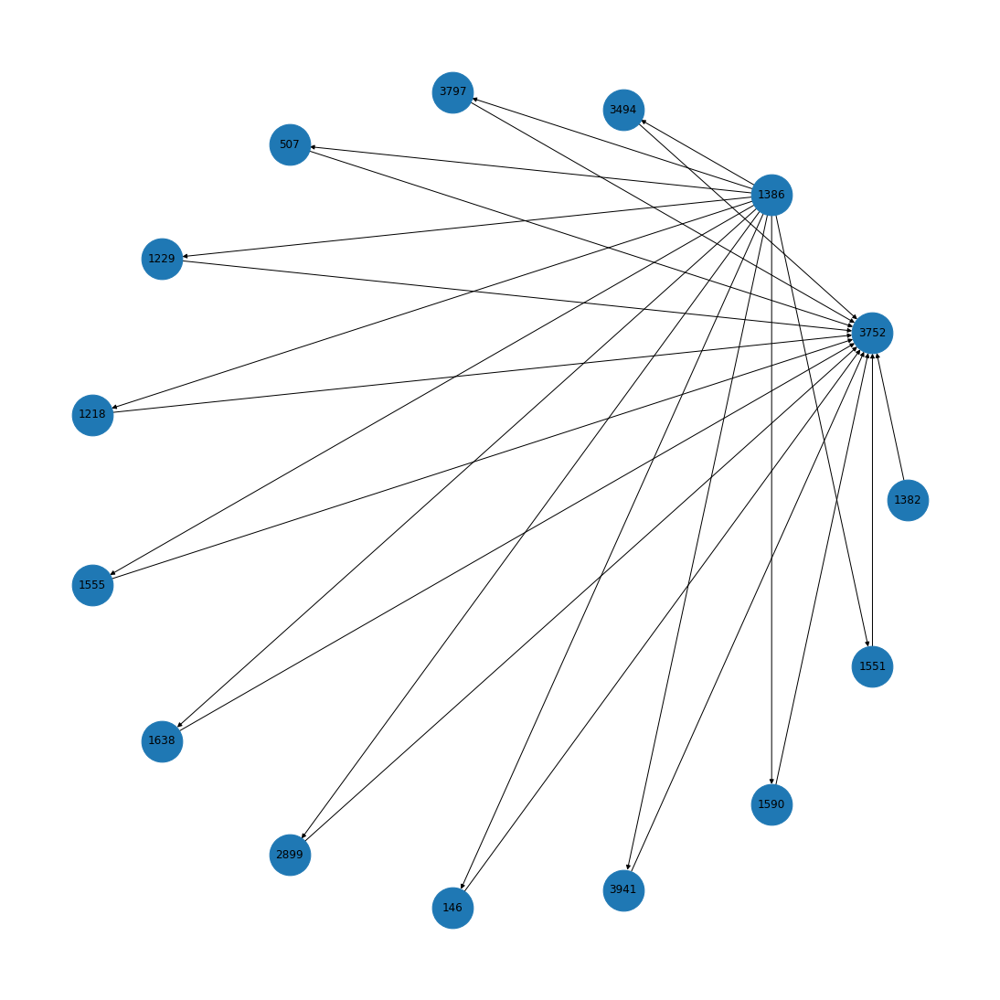

In [ ]:
res = []
for i in source_List:
  if(i in nodes):
    for j in destination_List:
      if(j in nodes): 
        re = nx.all_shortest_paths(G,i,j)
        for n in re:
          res.append(n)

new_g = nx.DiGraph()
for i in res:
  for j in i:
    new_g.add_node(j)

for i in res:
  for j in range(0,len(i)-1):
    new_g.add_edge(i[j],i[j+1])
plt.figure(figsize=(15,15))
nx.draw_circular(new_g, with_labels=True, node_size=2000 )

#Degree Centrality

In [ ]:
import operator

with open('airdata.csv','r') as csv_file1:
    lines1 = csv_file1.readlines()
lines1 = lines1[1:]

main_airport = nx.degree_centrality(G)

top_List = sorted(main_airport.items(), key=operator.itemgetter(1),reverse=True)[:5]
degree = []
for i in top_List:
  t = None
  for line in lines1:
    data = line.split(",")
    if(data[0] == i[0]):
      t = data[2][1:-1]
  degree.append(t)
print(degree)


['Frankfurt', 'Paris', 'Amsterdam', 'Istanbul', 'Atlanta']


#in_degree centrality

['Frankfurt', 'Paris', 'Amsterdam', 'Istanbul', 'Atlanta']


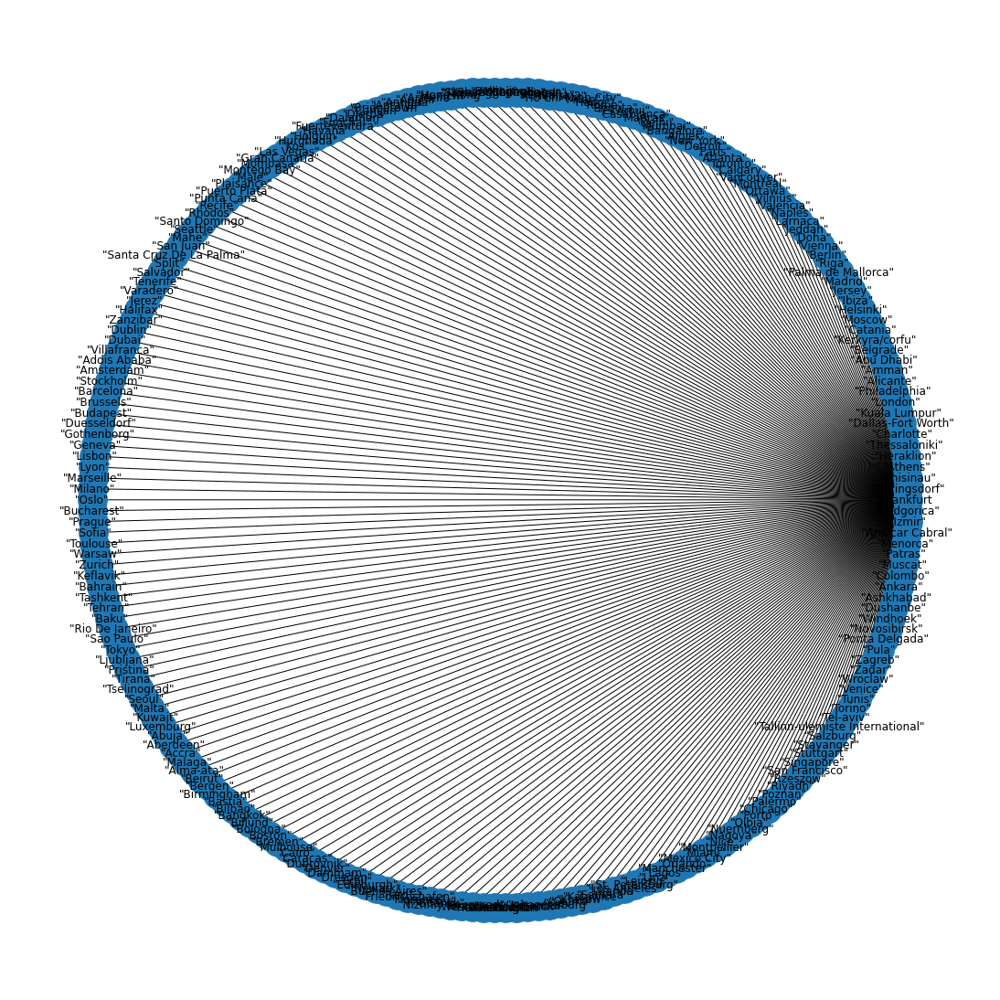

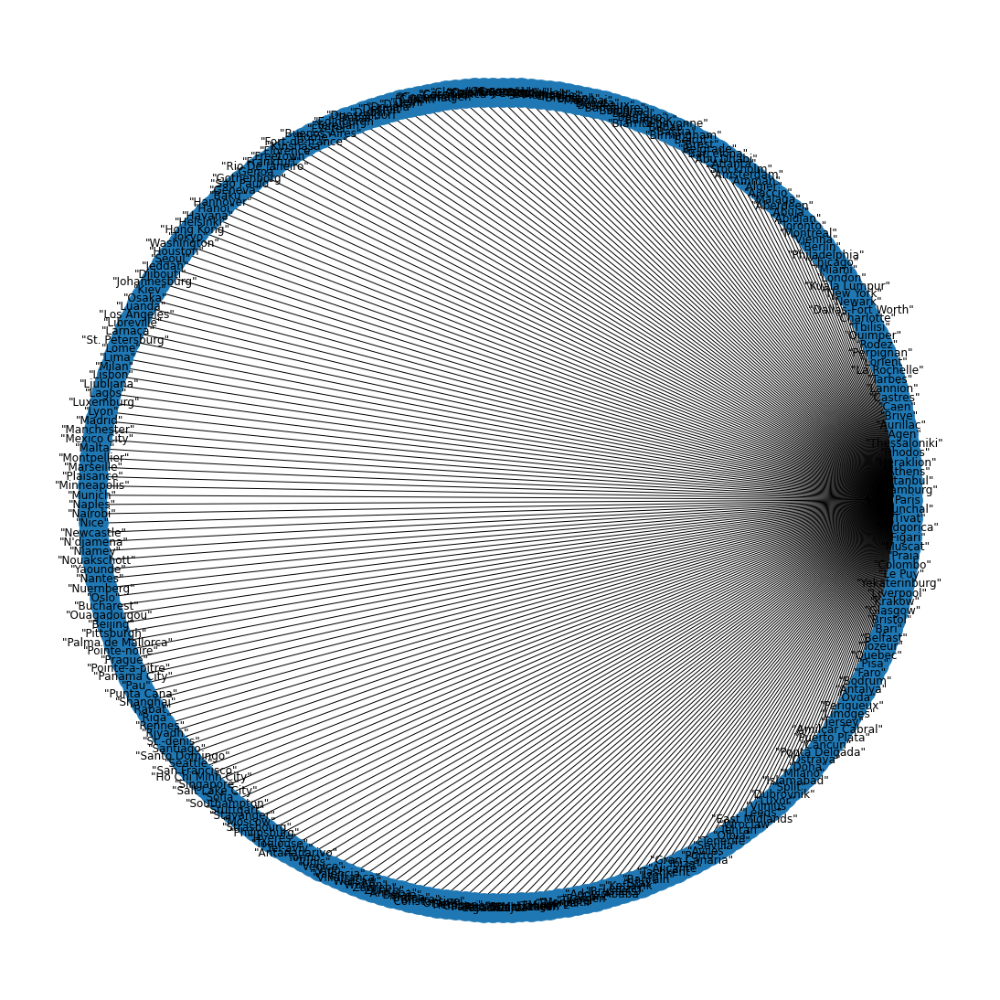

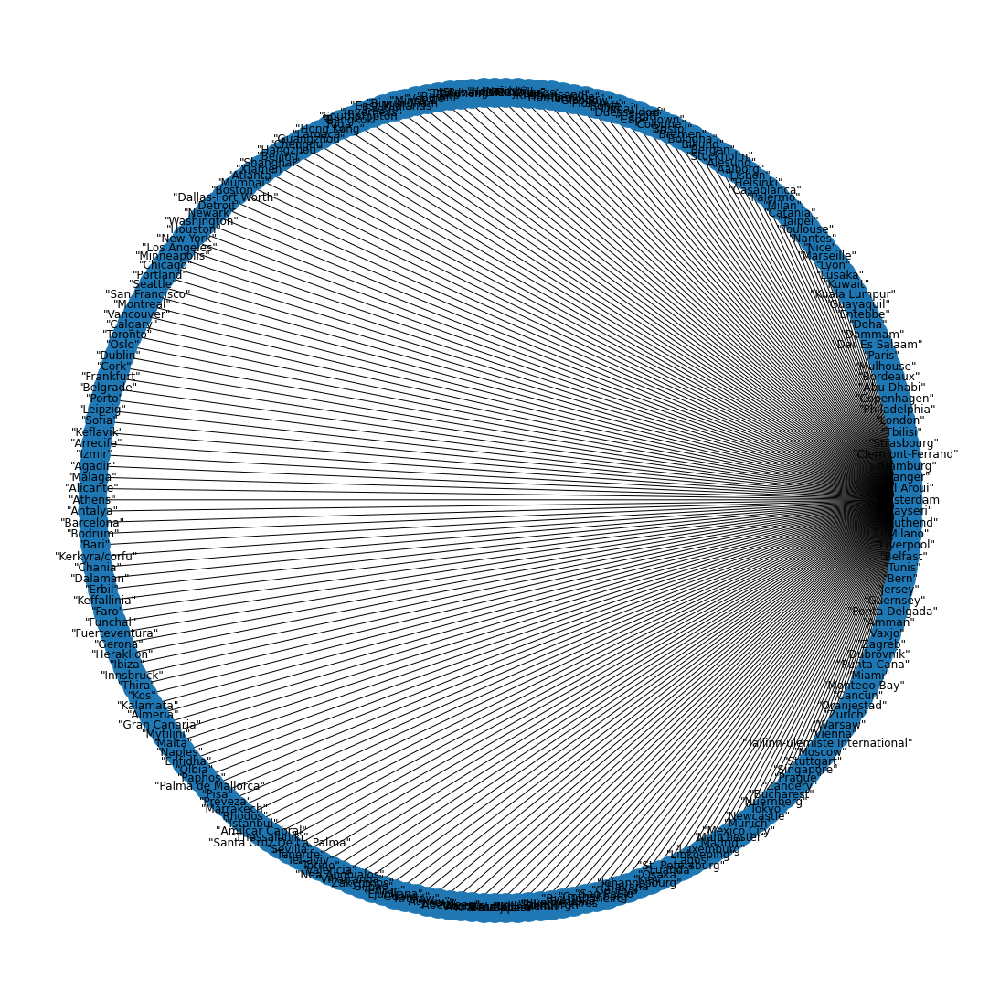

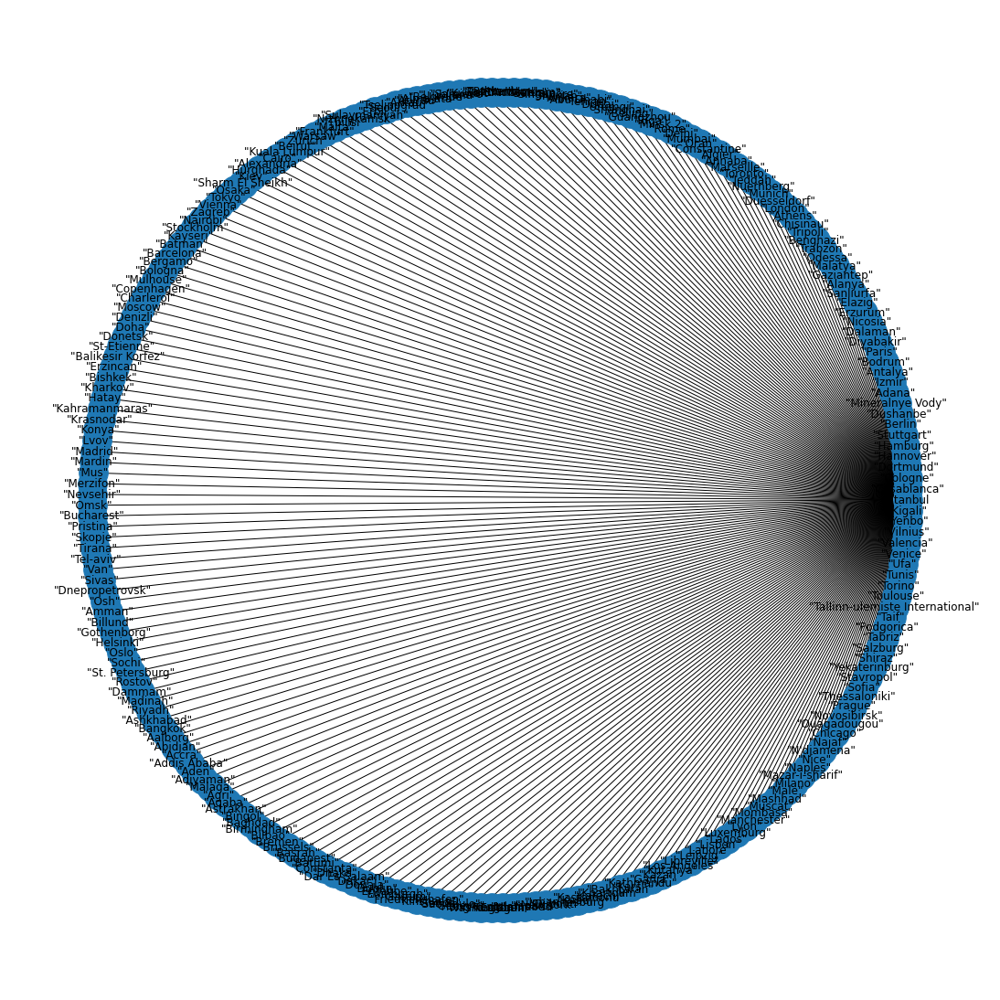

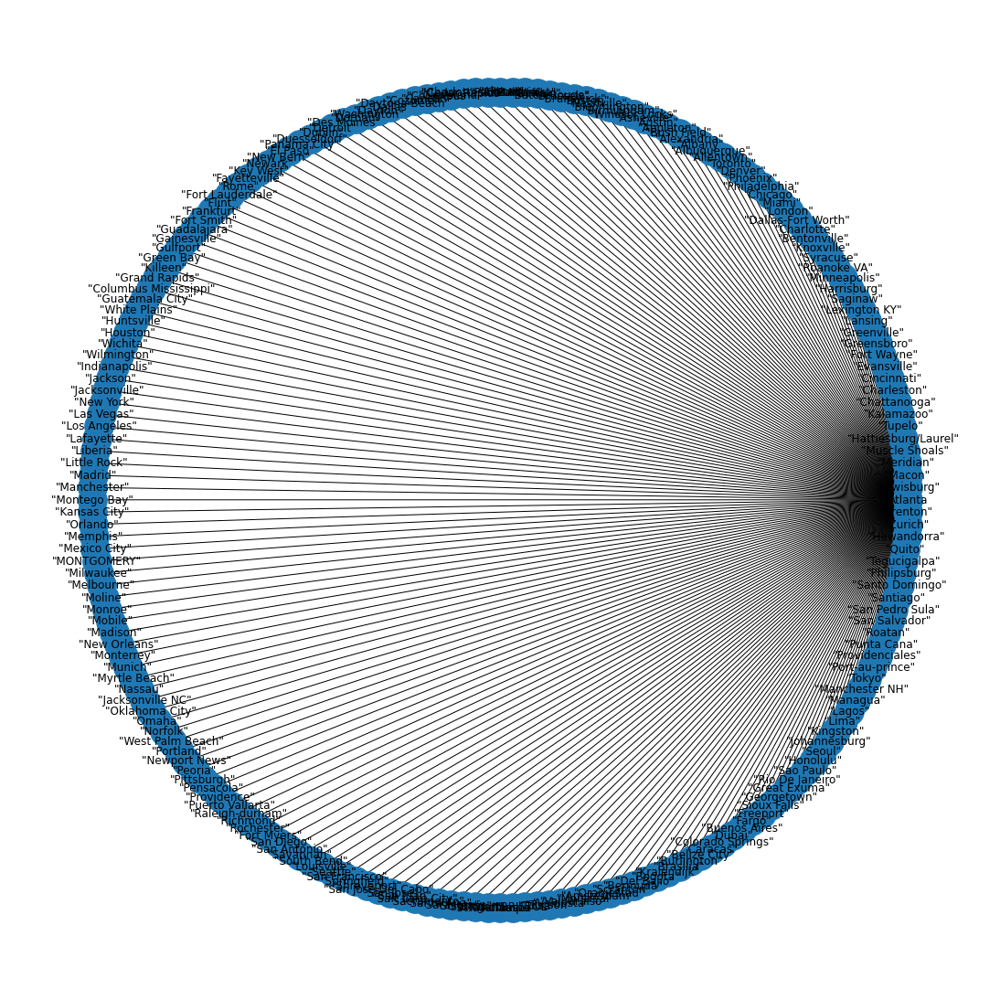

In [ ]:
import operator

with open('airdata.csv','r') as csv_file1:
    lines1 = csv_file1.readlines()
lines1 = lines1[1:]

in_airport = nx.in_degree_centrality(G)

top_List = sorted(in_airport.items(), key=operator.itemgetter(1),reverse=True)[:5]

in_degree = []
for i in top_List:
  t = None
  for line in lines1:
    data = line.split(",")
    if(data[0] == i[0]):
      t = data[2][1:-1]
  in_degree.append(t)
print(in_degree)
in_degree_g = []
for i in range(len(degree)):
  t = nx.DiGraph()
  in_degree_g.append(t)
for i in range(len(degree)):
  in_degree_g[i].add_node(degree[i])
in_degree_node=[]
for i in degree:
  t = []
  for line in lines:
    data = line.split(",")
    if(i.lower() == (data[2][1:-1]).lower()):
      t.append(data[0])
  in_degree_node.append(t)
with open('airdata1.csv','r') as csv_file_1:
  lines_1 = csv_file_1.readlines()
lines_1 = lines_1[1:]
for i in range(len(in_degree_node)):
  for line in lines_1:
    data = line.split(",")
    for j in in_degree_node[i]:
      if(j == data[1] and data[0] != '\\N'):
        for line_1 in lines:
          data_1 = line_1.split(",")
          if(data_1[0] == data[0]):
            in_degree_g[i].add_node(data_1[2])
            in_degree_g[i].add_edge(data_1[2],degree[i])

for i in range(len(degree)):
  plt.figure(figsize=(15,15))
  nx.draw_circular(in_degree_g[i], with_labels=True, node_size=1000)

#out_degree centrality

['Frankfurt', 'Paris', 'Amsterdam', 'Istanbul', 'Atlanta']


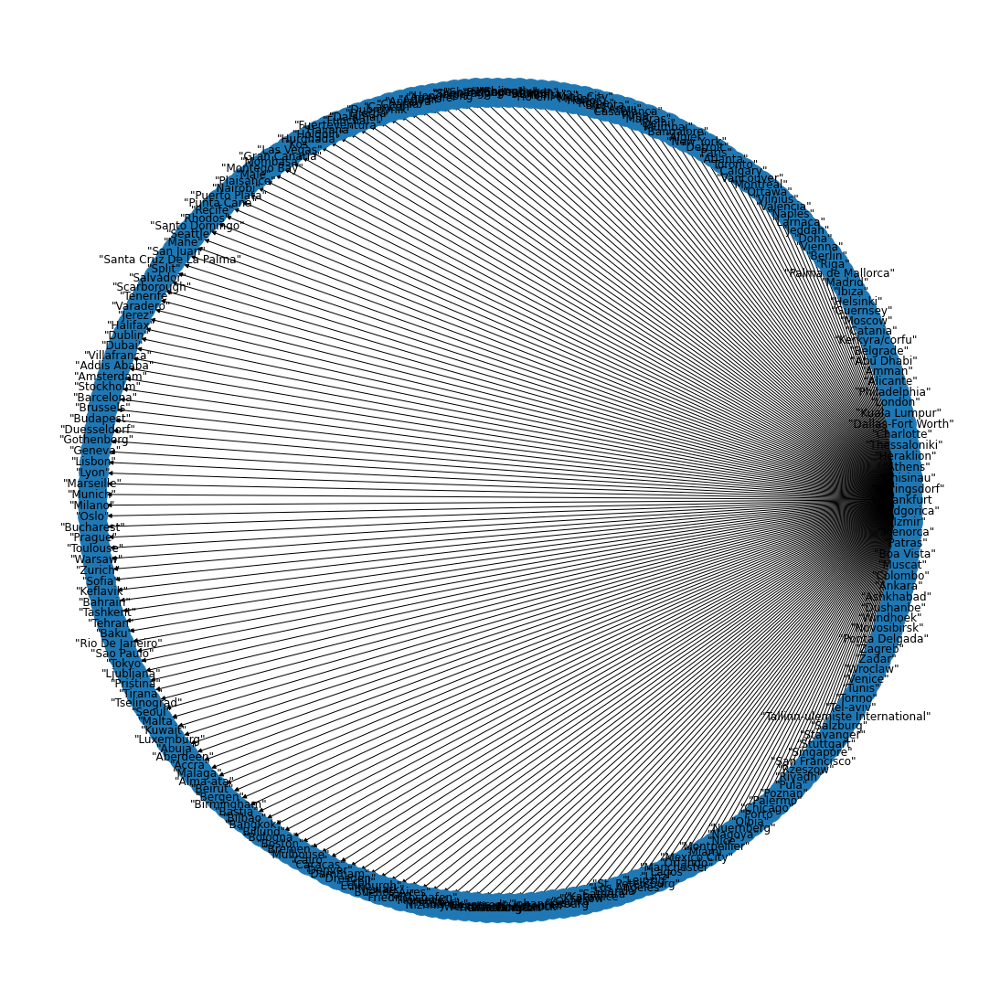

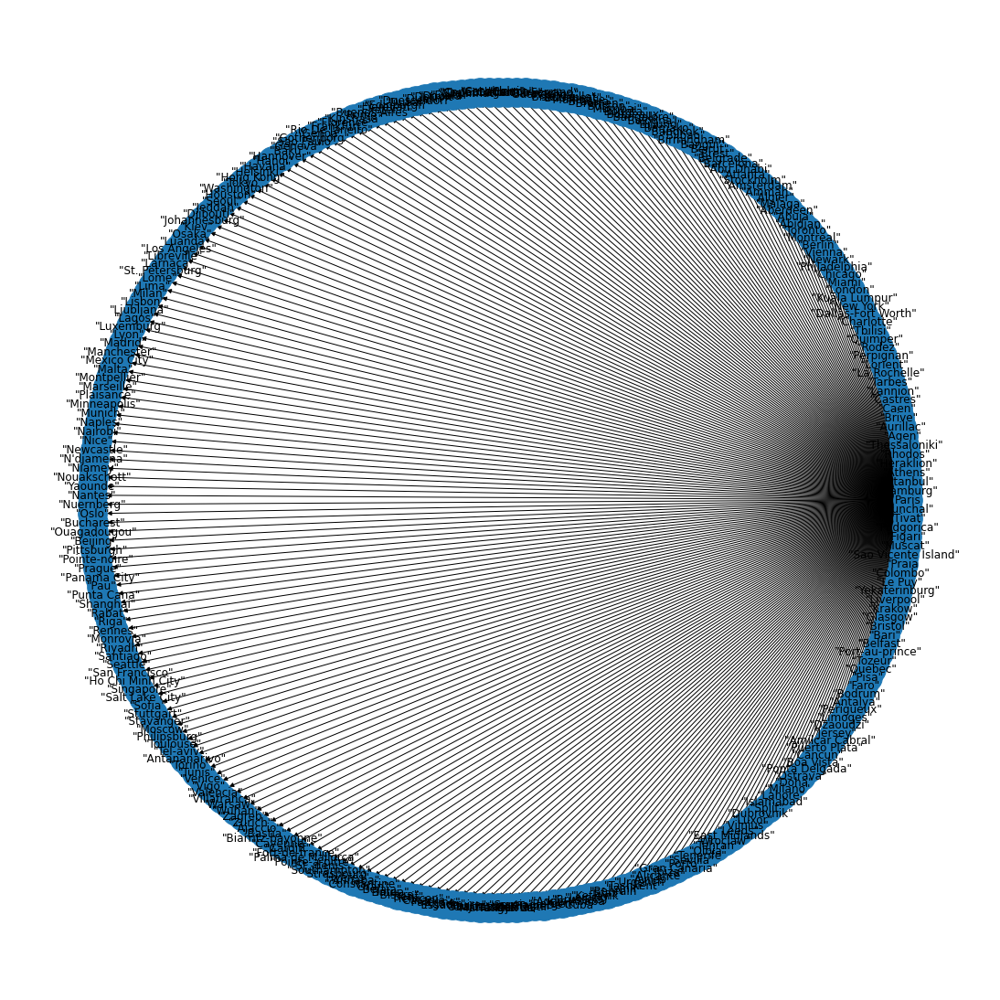

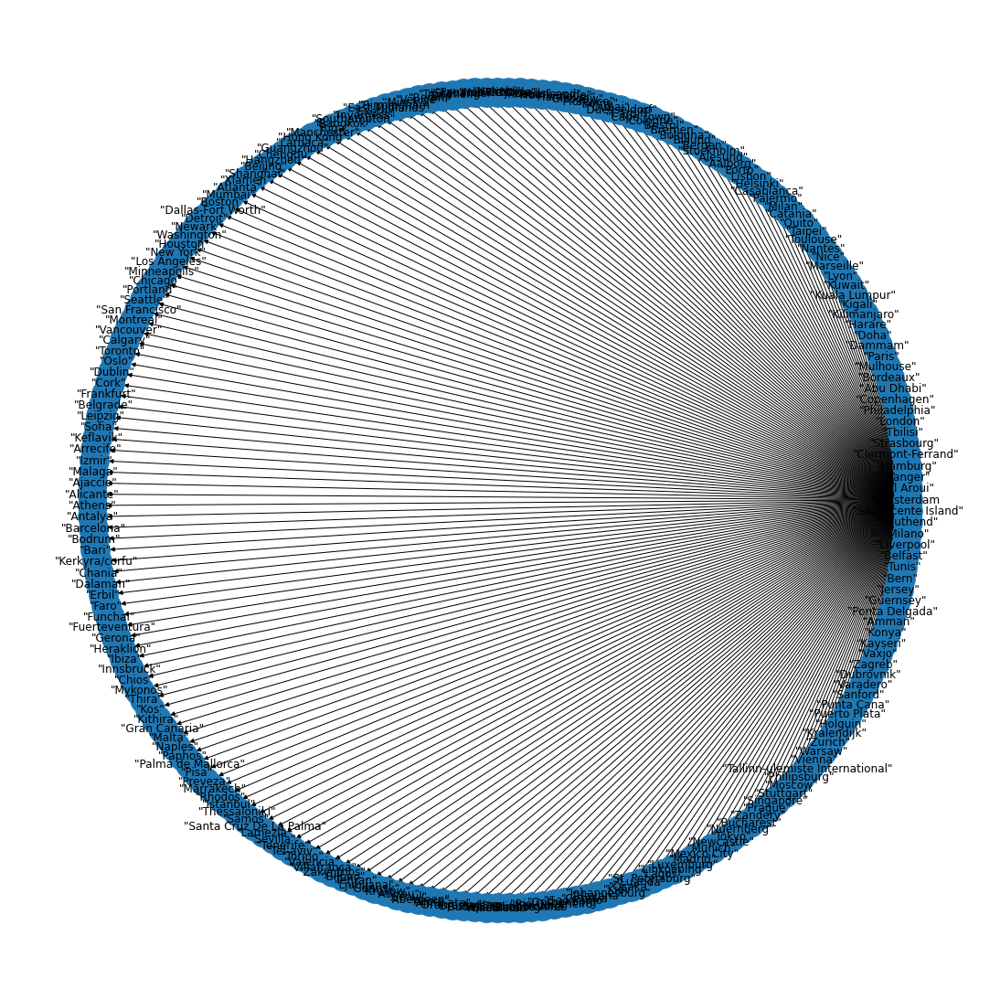

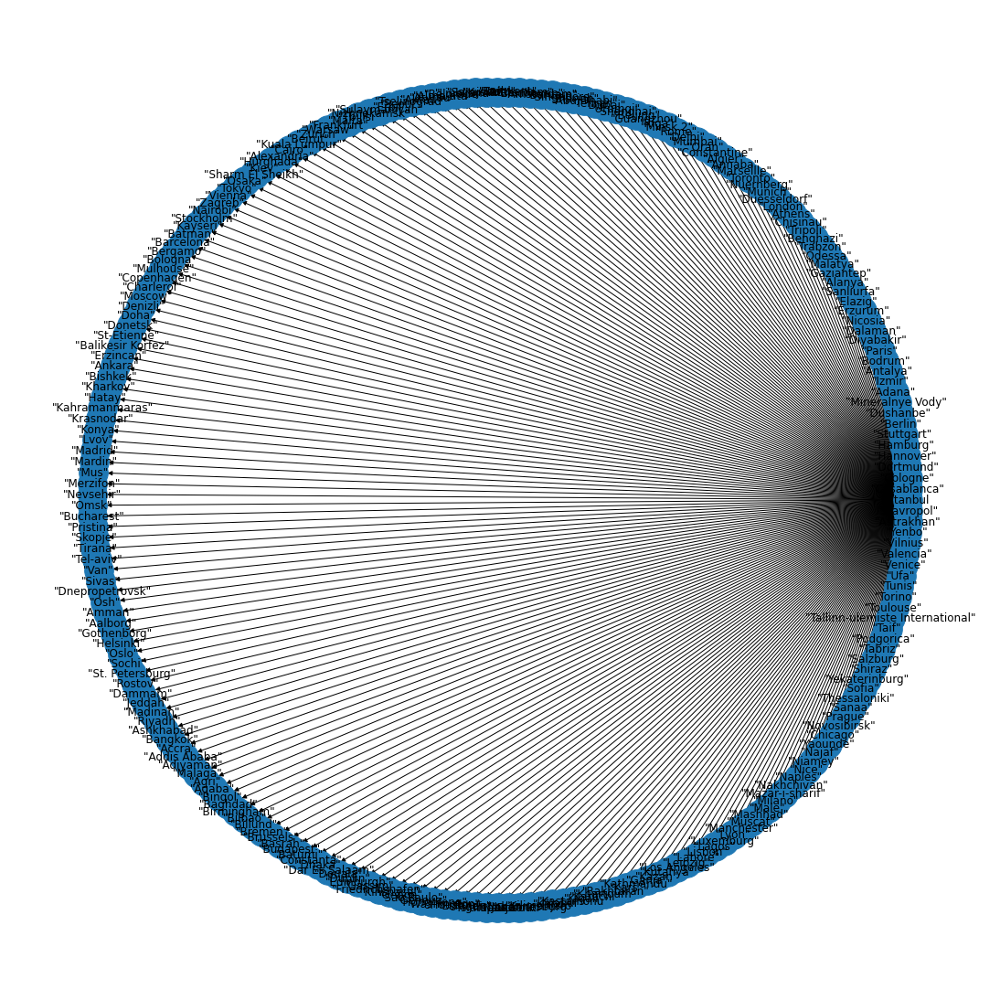

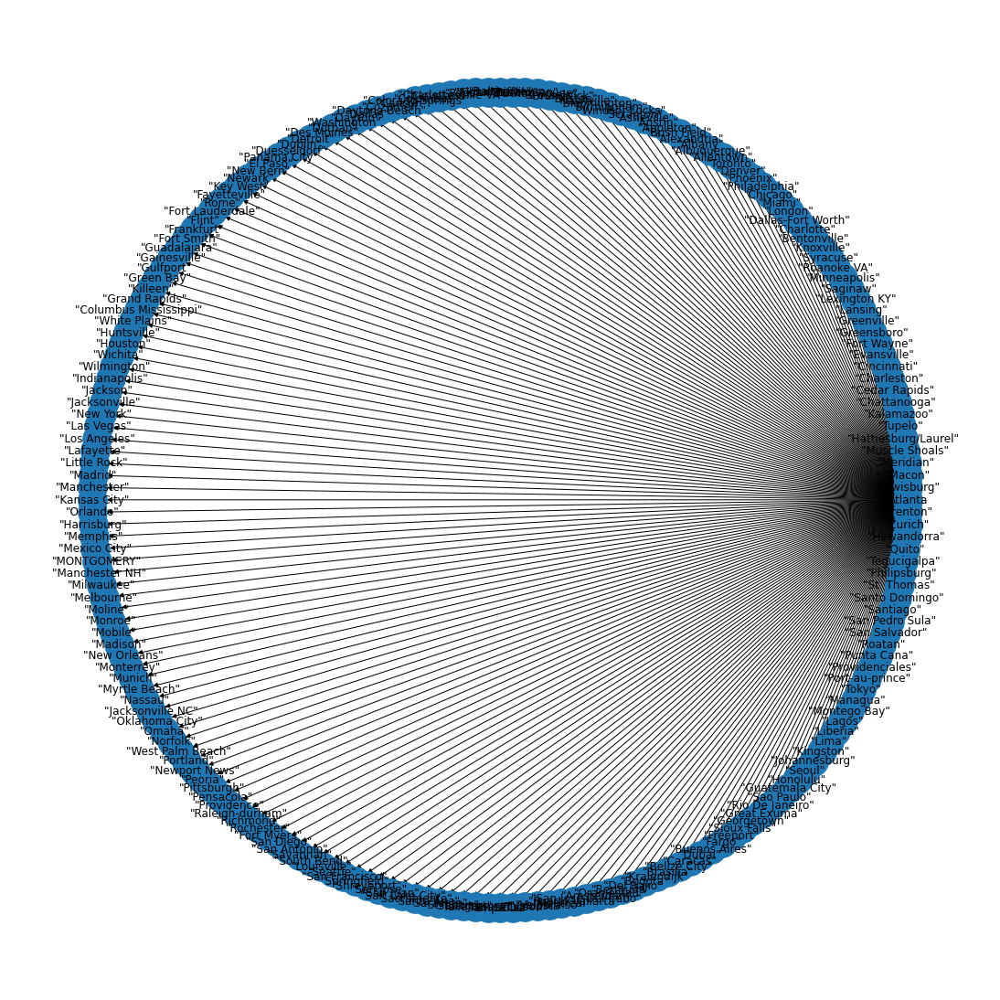

In [ ]:
import operator

with open('airdata.csv','r') as csv_file1:
    lines1 = csv_file1.readlines()
lines1 = lines1[1:]

main_airport = nx.out_degree_centrality(G)

top_List = sorted(main_airport.items(), key=operator.itemgetter(1),reverse=True)[:5]
out_degree  = []
for i in top_List:
  t = None
  for line in lines1:
    data = line.split(",")
    if(data[0] == i[0]):
      t = data[2][1:-1]
  out_degree.append(t)
print(out_degree)
out_degree_g = []
for i in range(len(degree)):
  t = nx.DiGraph()
  out_degree_g.append(t)
for i in range(len(degree)):
  out_degree_g[i].add_node(degree[i])
out_degree_node=[]
for i in degree:
  t = []
  for line in lines:
    data = line.split(",")
    if(i.lower() == (data[2][1:-1]).lower()):
      t.append(data[0])
  out_degree_node.append(t)

with open('airdata1.csv','r') as csv_file_1:
  lines_1 = csv_file_1.readlines()
lines_1 = lines_1[1:]
for i in range(len(out_degree_node)):
  for line in lines_1:
    data = line.split(",")
    for j in out_degree_node[i]:
      if(j == data[0] and data[1] !='\\N'):
        for line_1 in lines:
          data_1 = line_1.split(",")
          if(data_1[0] == data[1]):
            out_degree_g[i].add_node(data_1[2])
            out_degree_g[i].add_edge(degree[i],data_1[2])

for i in range(len(degree)):
  plt.figure(figsize=(15,15))
  nx.draw_circular(out_degree_g[i], with_labels=True, node_size=1000)

#Busiest route

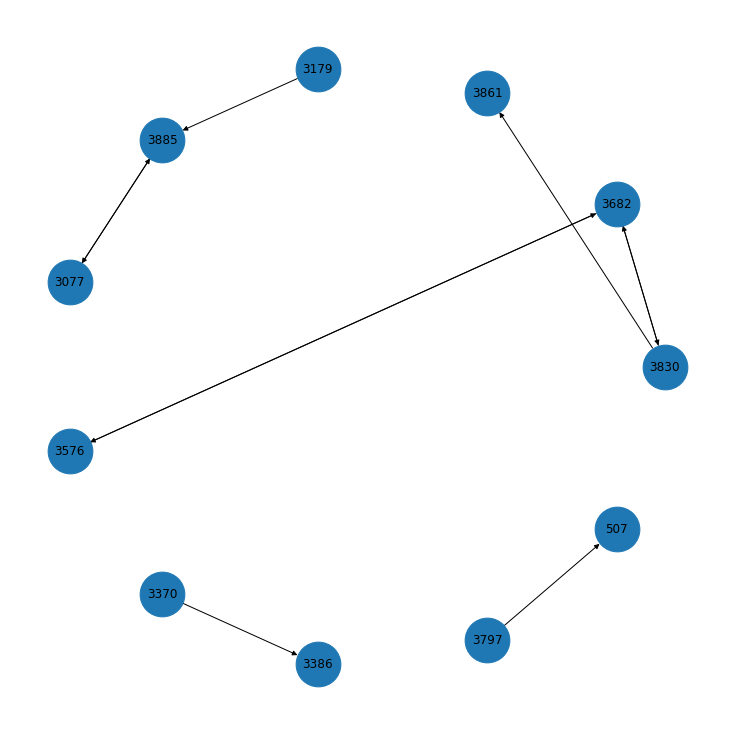

In [ ]:
edge_weight = nx.get_edge_attributes(G,'weight')
edge_weight = sorted(edge_weight.items(),key=operator.itemgetter(1),reverse=True)[:10]

busy_route = nx.DiGraph()
for i in edge_weight:
  busy_route.add_node(i[0][0])
  busy_route.add_node(i[0][1])
  busy_route.add_edge(i[0][0],i[0][1])
plt.figure(figsize=(10,10))
nx.draw_circular(busy_route,with_labels=True,node_size = 2000)

#Bridge between two airports

In [ ]:
betweeness = nx.betweenness_centrality(G, normalized=True)

In [ ]:
bet = sorted(betweeness.items(), key=operator.itemgetter(1),reverse=True)[:5]

for i in bet:
  for line in lines:
    data = line.split(",")
    if(i[0] == data[0]):
      print(data[1])

"Ted Stevens Anchorage International Airport"
"Los Angeles International Airport"
"Charles de Gaulle International Airport"
"Dubai International Airport"
"Frankfurt am Main Airport"
